In [1]:
suppressPackageStartupMessages({
    
    library(APL)
    # library(CAbiNet)

    library(SingleCellExperiment)
    library(scater)
    library(scuttle)
    library(scran)

    library(tidyverse)
    library(plotly)
    library(ggrepel)
    library(ggthemes)
    
    library(ComplexHeatmap)
    library(circlize)
    library(ggsankey)
    library(dittoSeq)
    
})

devtools::load_all("/home/kohl/PhD/gits/VingronLab/CAbiNet")

dir <- "../Data/discussed_data/"

# Uncomment if you want to save results:
# (also uncomment code to save figures/results)

# resdir <- file.path(dir, "res")
# imgdir <- file.path(resdir,"img")

# fig3_dir <- file.path(imgdir, "fig3")
# sfig8_dir <- file.path(imgdir, "sfig8")

# dir.create(dir)
# dir.create(resdir)
# dir.create(imgdir)

# dir.create(fig3_dir)
# dir.create(sfig8_dir)


options(repr.plot.width = 15, repr.plot.height = 10)


ℹ Loading CAbiNet


Exports from /home/kohl/PhD/gits/VingronLab/CAbiNet/src/ComputeSNNasym.cpp:
   Eigen::SparseMatrix<double> ComputeSNNasym(Eigen::SparseMatrix<double> SNN, double prune, String mode)

Exports from /home/kohl/PhD/gits/VingronLab/CAbiNet/src/calc_overlap.cpp:
   Eigen::SparseMatrix<double> calc_overlap(Eigen::SparseMatrix<int> cc_adj, Eigen::SparseMatrix<int> cg_adj)

/home/kohl/PhD/gits/VingronLab/CAbiNet/src/RcppExports.cpp updated.
/home/kohl/PhD/gits/VingronLab/CAbiNet/R/RcppExports.R updated.


Re-compiling CAbiNet



─  installing *source* package ‘CAbiNet’ ... (393ms)
   ** using staged installation
   ** libs
   g++ -std=gnu++14 -I"/pkg/R-4.2.1-0/lib/R/include" -DNDEBUG  -I'/home/kohl/R/MarIuX64/R4.2/Rcpp/include' -I'/home/kohl/R/MarIuX64/R4.2/RcppEigen/include' -I/usr/local/include   -fpic  -g -O2  -UNDEBUG -Wall -pedantic -g -O0 -fdiagnostics-color=always -c ComputeSNNasym.cpp -o ComputeSNNasym.o
   In file included from /home/kohl/R/MarIuX64/R4.2/RcppEigen/include/Eigen/Core:397,
                    from /home/kohl/R/MarIuX64/R4.2/RcppEigen/include/Eigen/Dense:1,
                    from /home/kohl/R/MarIuX64/R4.2/RcppEigen/include/RcppEigenForward.h:30,
                    from /home/kohl/R/MarIuX64/R4.2/RcppEigen/include/RcppEigen.h:25,
                    from ComputeSNNasym.cpp:2:
   /home/kohl/R/MarIuX64/R4.2/RcppEigen/include/Eigen/src/Core/arch/SSE/PacketMath.h:60:39: warning: ignoring attributes on template argument ‘__m128’ [-Wignored-attributes]
      60 | template<> struct is_arithm

In [2]:
marker_genes <- read_csv(file.path("./tabula_muris/tabula_muris_marker_genes.csv"))


Rows: 19 Columns: 2
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (2): cell_type, gene

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


# Pre-processing & QC

Either load the preprocessed data or re-run the preprocessing. 
In the latter case the results will vary slightly from the version in the paper due the stochasticity of some of the functions in the pre-processing.

Instead of using any files provided by us, you can also get the original file from the `TabulaMurisData` package.

``` r
library(TabulaMurisData)

sce <- TabulaMurisSmartSeq2()
sce <- sce[, sce$tissue == "Limb_Muscle"]
sce <- sce[, !is.na(sce$cell_ontology_class)] # Remove un-annotated cells.

```


To skip the pre-processing load the *_preprocessed.rds file, otherwise uncomment the code to load the *_raw.rds file as well as the code below.

In [3]:
# pre-processed data:
# sce_sub <- readRDS(file.path(dir, "tabula_muris_raw.rds"))
sce_sub <- readRDS(file.path(dir, './tabula_muris_preprocessed.rds'))


Warning message in gzfile(file, "rb"):
“cannot open compressed file '../Data/discussed_data//./tabula_muris_preprocessed.rds', probable reason 'No such file or directory'”


ERROR: Error in gzfile(file, "rb"): cannot open the connection


Uncomment to re-run pre-processing:

In [4]:
# set.seed(123)

# sce <- readRDS(file.path(dir, "tabula_muris_raw.rds"))

# mt_genes <- grepl("^mt-",  rownames(sce), ignore.case = TRUE)

# qc_df <- perCellQCMetrics(sce, subsets=list(Mito=mt_genes))

# reasons <- perCellQCFilters(qc_df, 
#                             sum.field = "sum",
#                             detected.field = "detected",
#                             sub.fields=c("subsets_Mito_percent"))

# colData(sce) <- cbind(colData(sce), qc_df)
# sce$discard <- reasons$discard

# umap_discard <- plotUMAP(sce, colour_by="discard")
# umap_discard 

# sce <- sce[,!reasons$discard]


# clust.sce <- quickCluster(sce) 
# sce <- computeSumFactors(sce, cluster=clust.sce, min.mean=0.1)
# sce <- logNormCounts(sce)

# sce.dec <- modelGeneVarByPoisson(sce)
# sce.top <- getTopHVGs(sce.dec, prop=0.2)


# p_umap<- plotUMAP(sce, colour_by="cell_ontology_class")
# p_umap


# sce$quickCluster <- clust.sce
# sce <- scDblFinder::scDblFinder(sce, clusters="quickCluster")
# table(sce$scDblFinder.class)

# p_umap_dblclass <- plotUMAP(sce, colour_by="scDblFinder.class")
# p_umap_dblclass

# sce <- sce[,sce$scDblFinder.class != "doublet"]

# cnts<- as.matrix(logcounts(sce))
# genes_detect <- rowSums(cnts > 0) > (ncol(cnts)*0.01)
# cnts <- cnts[genes_detect,]
# sce_sub <- sce[genes_detect,]



# CAbiNet

## Correspondence analysis

In [6]:
ca <- cacomp(obj = logcounts(sce_sub),
             princ_coords = 3,
             dims = 40, 
             top = nrow(sce_sub),
             residuals = "pearson",
             python = TRUE)

## CAbiNet clustering

In [7]:
cabic <-  run_caclust(ca, 
                      k = c(100, 50, 100, 100),
                      resolution = 1,
                      loops = FALSE,
                      SNN_prune = 1/15,
                      mode = "all",
                      select_genes = TRUE,
                      prune_overlap = TRUE,
                      overlap = 0.2,
                      calc_gene_cell_kNN = FALSE,
                      algorithm = 'leiden',
                      marker_genes = marker_genes$gene,
                      rand_seed = 2358)
cabic



Warning message in create_bigraph(cell_dists = distances[["cc"]], gene_dists = distances[["gg"]], :
“Not all marker genes are in the provided data.”


caclust object with 1838 cells and 2029 genes.
9 clusters found.
Clustering results:

 cluster ncells ngenes
 1       487    523   
 2       415    298   
 3       287    194   
 4       189    251   
 5       225    206   
 6       158    254   
 7        74    170   
 8         2     97   
 9         1     36   

In [8]:
sce_sub$cabinet_cluster <- cell_clusters(cabic)
ari <- mclust::adjustedRandIndex(cell_clusters(cabic), sce_sub$cell_ontology_class)
ari

# Remove monoclusters from results
cabic <- rm_monoclusters(cabic)

[1] 0.6741216

## Compute the biMAP

In [9]:
cabic <- biMAP(obj = cabic,
               k = 30, 
               rand_seed = 2358, 
               method = "SNNdist")

# Supplementary Figure 1

## biMAP - panel a

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


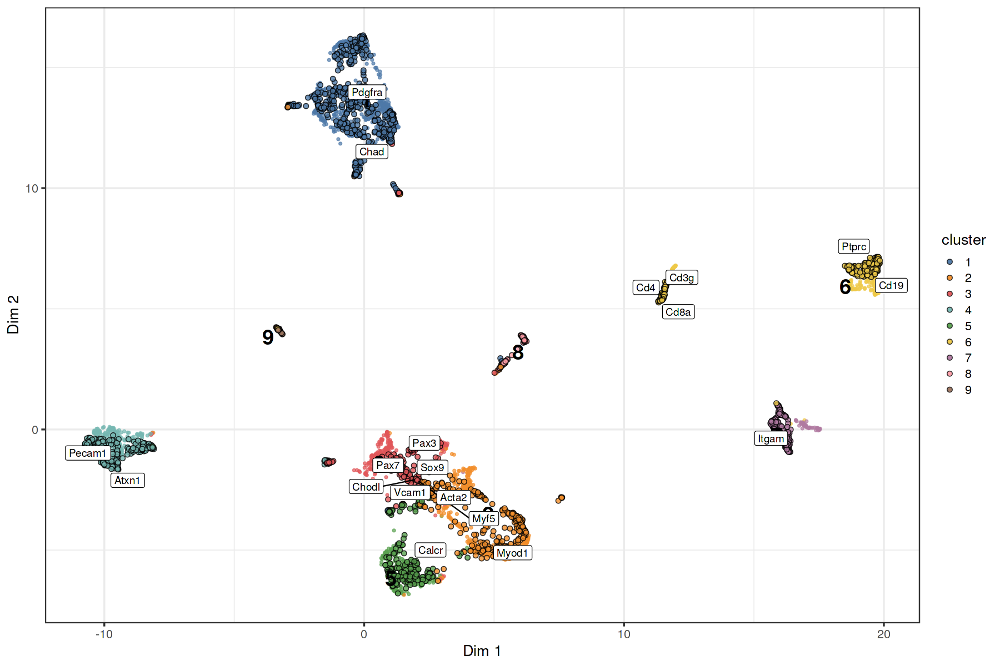

In [10]:

pal <- tableau_color_pal("Tableau 10")

clusters <- unique(c(cell_clusters(cabic), gene_clusters(cabic)))
color_theme <- pal(length(unique(clusters)))
names(color_theme) <- as.character(sort(clusters))

p <- plot_scatter_biMAP(cabic,
                        label_groups = TRUE, 
                        color_genes = TRUE,
                        group_label_size = 8) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16) +
    theme(legend.position = "right",
          panel.background = element_rect(fill='transparent'), 
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent') 
         ) +
geom_label_repel(data = cabic@bimap[cabic@bimap$name %in% c(marker_genes$gene, "Pax3"),],
                     aes(x, y, label=name),
                     color = "black",
                     max.overlaps = Inf) 
p


# ggsave(plot = p, 
#        filename = file.path(fig3_dir, "scatter_biMAP_clusters_fig3_panel_a.pdf"),
#        width = 2500,
#        height = 2300,
#        units = "px",
#        bg = "transparent")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


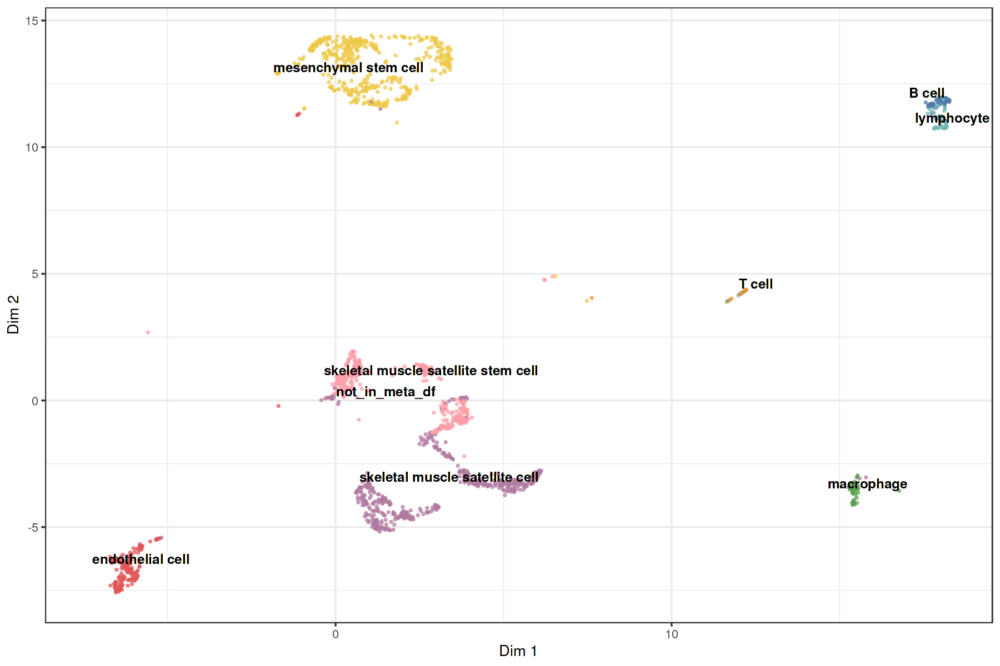

In [10]:
# not included in paper

pal <- tableau_color_pal("Tableau 10")

clusters <- unique(sce_sub$cell_ontology_class)
cols <- pal(length(unique(clusters)))
names(cols) <- as.character(sort(clusters))

p <- plot_scatter_biMAP(obj = cabic, 
                        group_label_size = 5,
                        cell_size = 1, 
                        gene_alpha = 0,
                        label_groups = TRUE, 
                        color_genes = FALSE,
                        meta_df = colData(sce_sub), 
                        color_by = "cell_ontology_class") + 
    scale_color_manual(values = cols) +
    theme_bw(base_size = 16) +
    theme(legend.position = "none",
          panel.background = element_rect(fill='transparent'),
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent')
         )
p

# ggsave(plot = p, 
#        filename = file.path(imgdir, "scatter_biMAP_cell_types.pdf"),
#        width = 2500,
#        height = 2300,
#        units = "px")

## interactive biMAP

### interactive scatter plot

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomTextRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”
Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


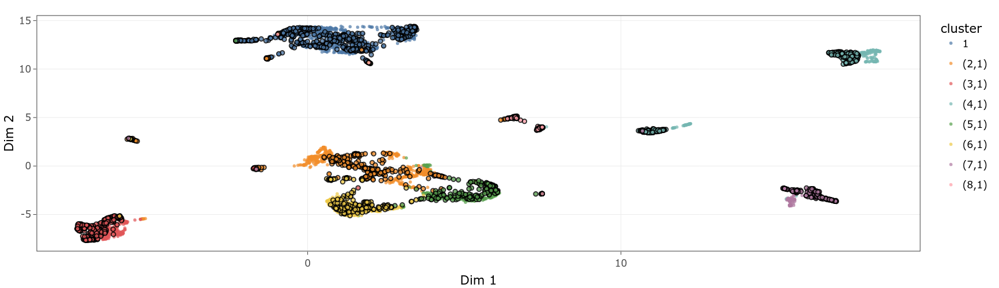

In [11]:

p <- plot_scatter_biMAP(cabic,
                        color_genes = TRUE) + 
    scale_color_manual(values = color_theme) +
    scale_fill_manual(values = color_theme) +
    theme_bw(base_size = 16)

interactive <- ggplotly(p)
interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_bimap.html"))

### interactive hex plot

Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomTextRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”
Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


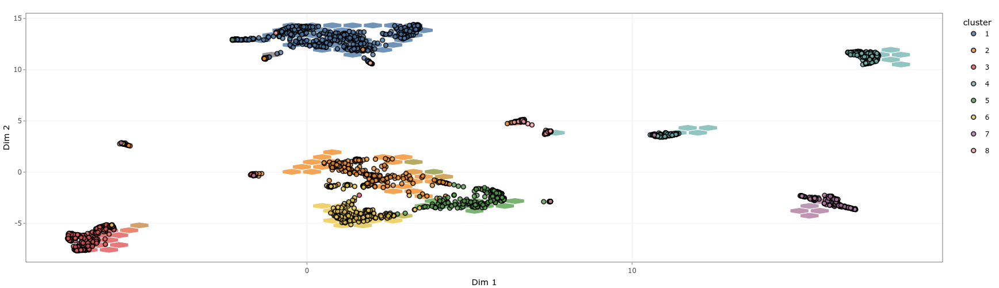

In [12]:

interactive <- plot_hex_biMAP(cabic,
                    color_genes = TRUE,
                    colors = color_theme,
                    interactive = TRUE)

interactive %>% layout(autosize = FALSE, width = 700, height = 500)

# htmlwidgets::saveWidget(interactive, file.path(imgdir, "interactive_hex_bimap.html"))

## Sankey plot - panel b

Warning message:
“attributes are not identical across measure variables;
they will be dropped”
`summarise()` has grouped output by 'Biclusters'. You can override using the `.groups` argument.


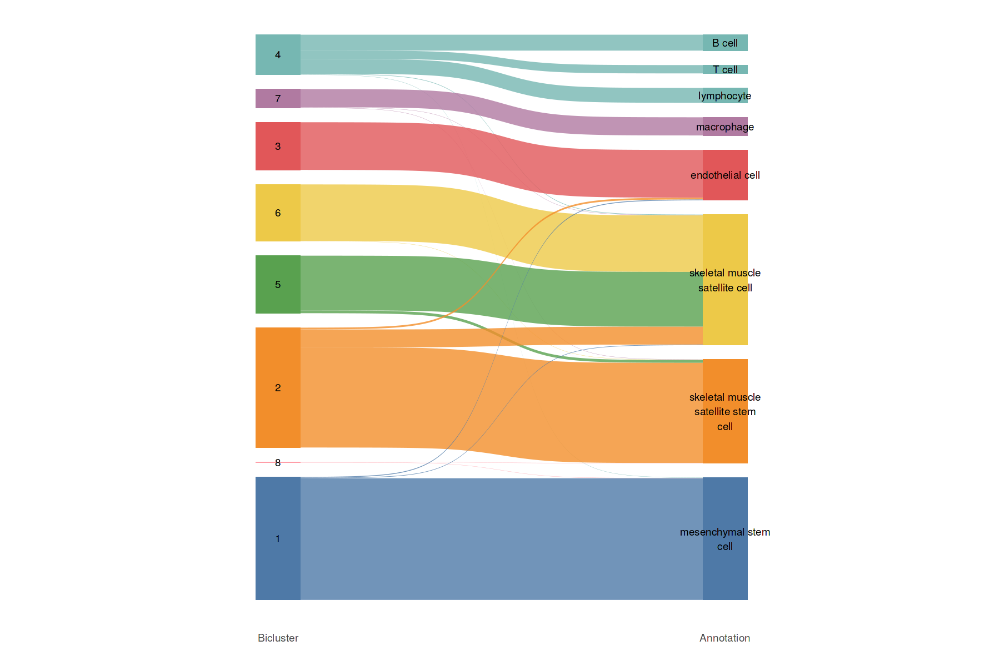

In [13]:
data <- colData(sce_sub) %>%
        as.data.frame() %>%
        rename('Annotation' = "cell_ontology_class",
               'Bicluster' = "cabinet_cluster")

df <- data %>% 
    make_long(Bicluster, Annotation)

info  <-  data.frame(Biclusters = as.factor(data$Bicluster),
                     Truth = as.character(data$Annotation)) %>%  
                as_tibble() %>%
                group_by(Biclusters, Truth) %>% 
                summarise(n = n()) %>%
                group_by(Truth) %>% 
                mutate(Partition = n/sum(n)) %>%
                ungroup() %>% 
                as.data.frame() %>% 
                group_by(Truth) %>%
                filter(Partition == max(Partition) ) %>%
                dplyr::select(Biclusters, Truth) %>%
                distinct(Biclusters, .keep_all = TRUE)


cts <- unique(data$Bicluster)

if (length(cts) > 10){
    tbl_col <- "Tableau 20"
} else {
    tbl_col <- "Tableau 10"
}

pal <- tableau_color_pal(tbl_col)

cols <- color_theme

info <- left_join(data.frame("Biclusters" = names(cols), "col" = cols), info, by = "Biclusters")


cols <- c(cols, info$col)

names(cols) <- c(names(color_theme), info$Truth)


order <- c("mesenchymal stem cell", 
           "skeletal muscle satellite stem cell",
           "skeletal muscle satellite cell",
           "endothelial cell",
           "macrophage",
           "lymphocyte",
           "T cell",
           "B cell",
           "1",
           "8",
           "2",
           "5",
           "6",
           "3",
           "7",
           "4")

# If preprocessing is rerun, use code below:
# order <- c("mesenchymal stem cell", 
#            "skeletal muscle satellite stem cell",
#            "skeletal muscle satellite cell",
#            "endothelial cell",
#            "macrophage",
#            "lymphocyte",
#            "T cell",
#            "B cell",
#            "1",
#            "8",
#            "3",
#            "2",
#            "5",
#            "4",
#            "7",
#            "6")


wrap <- 17
df$node <- factor(stringr::str_wrap(df$node, wrap), levels = stringr::str_wrap(order, wrap))
df$next_node <- factor(stringr::str_wrap(df$next_node, wrap), levels = stringr::str_wrap(order, wrap))

names(cols) <- stringr::str_wrap(names(cols), wrap)


sank <- ggplot(df, aes(x = x, 
               next_x = next_x, 
               node = node, 
               next_node = next_node,
               fill = node,
               label = as.character(node))) +
  geom_sankey(flow.alpha = 0.8) +
  geom_sankey_text() +
  labs(x = "") +
  scale_fill_manual(values = cols) +
  theme_sankey(base_size = 14) +
  theme(legend.position = "none")

sank

# ggsave(plot = sank, 
#        filename = file.path(fig3_dir, "sankey_plot_fig3_panel_b.pdf"),
#        width = 2700,
#        height = 2000,
#        units = "px")


## Heatmap - panel c

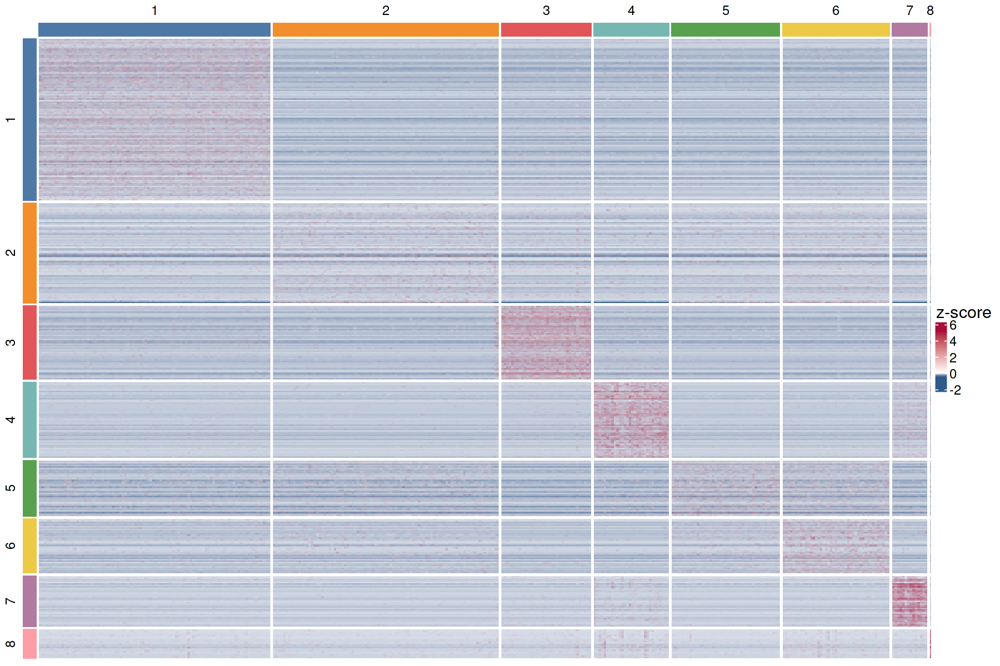

In [14]:

mono_cabic <- cabic

mat <- as.matrix(logcounts(sce_sub[names(gene_clusters(mono_cabic)),names(cell_clusters(mono_cabic))]))

mat  <- (mat - rowMeans(mat))/rowSds(mat)
mat[is.na(mat)] <- 0

clust_order_cells <- c()
un_cc <- sort(unique(cell_clusters(mono_cabic)))
for (i in seq_along(un_cc)){
    clust_order_cells <- c(clust_order_cells, which(cell_clusters(mono_cabic) == un_cc[i]))
}
                           
clust_order_genes <- c()
un_gc <- sort(unique(gene_clusters(mono_cabic)))
for (i in seq_along(un_gc)){
    clust_order_genes <- c(clust_order_genes, which(gene_clusters(mono_cabic) == un_gc[i]))
}                           

mat <- mat[clust_order_genes, clust_order_cells]

ccs <- cell_clusters(mono_cabic)[colnames(mat)]
gcs <- gene_clusters(mono_cabic)[rownames(mat)]

                               
col_fun = colorRamp2(c(quantile(mat,0.01), 0, quantile(mat,0.99)),
                     c("#2E5A87", "white", "#A90C38"))
                               
if (length(un_cc) <= 10){
    pal <- tableau_color_pal("Tableau 10")
} else {
    pal <- tableau_color_pal("Tableau 20")
}

annocol <- pal(length(un_cc))
                               
names(annocol) <- as.character(un_cc)

                               
                               
column_ha = HeatmapAnnotation(cluster = ccs,
                              col = list(cluster = annocol),
                              show_legend = c(FALSE), 
                              annotation_name_gp= gpar(fontsize = 0))


row_ha = rowAnnotation(cluster =  gcs,
                       col = list(cluster = annocol),
                       show_legend = c(FALSE),
                      annotation_name_gp= gpar(fontsize = 0))
               
                               
hm <- Heatmap(mat,
        name = "z-score",
        heatmap_legend_param = list(col_fun = col_fun, 
                                     title = "z-score",
                                     # grid_width = unit(5, "mm"),
                                     # legend_height = unit(3, "cm"),
                                     title_gp = gpar(fontsize = 18),
                                     labels_gp = gpar(fontsize = 14)),
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        show_column_names = FALSE,
        cluster_row_slices = FALSE,
        cluster_column_slices = FALSE,
        show_row_names = FALSE,
        row_title_side = "left",
        col = col_fun,
        top_annotation = column_ha,
        left_annotation = row_ha,
        use_raster = TRUE,
    	row_split = gcs,
        column_split = ccs,
        column_title_gp = gpar(fontsize = 14),
        row_title_gp = gpar(fontsize = 14))
                               

hm

# png(file = paste0(fig3_dir, "/heatmap_fig3_panel_c.png"),
#     width = 800,
#     height = 600,
#     unit = "px")
# hm
# dev.off()                              


## Dotplot - panel d

In [15]:
gois <- c("Pdgfra",
          "Itgam",
          "Cd19",
          "Cd3g",
          "Calcr",
          "Myod1",
          "Pax7",
          "Pax3",
          "Myf5")

New names:
• `` -> `...1`
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...8`
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


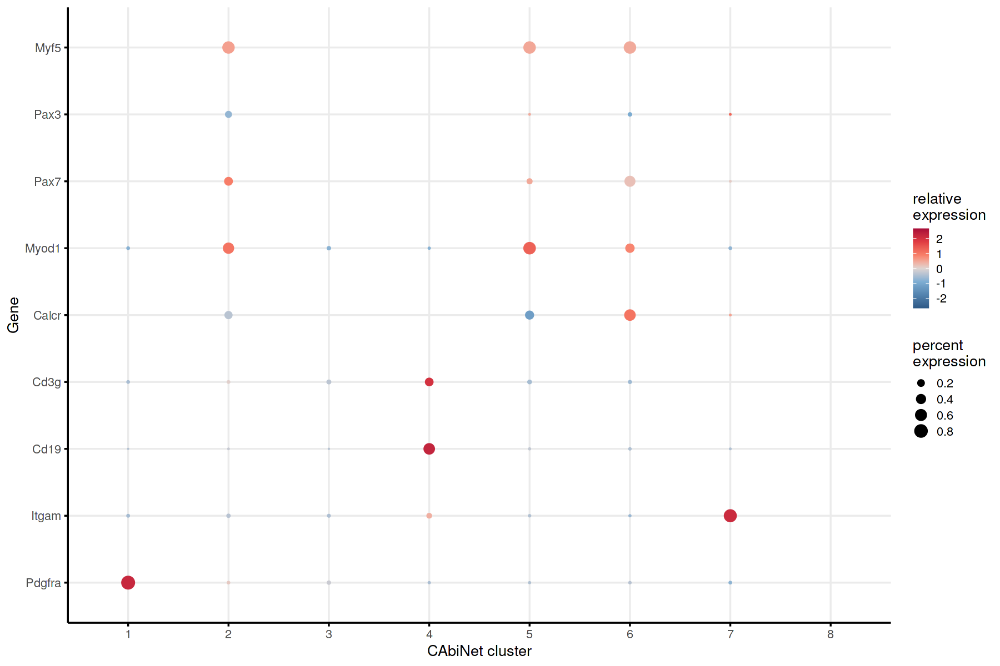

In [16]:
zsc <- logcounts(sce_sub[gois,])
zsc <- purrr::map_dfc(unique(sce_sub$cabinet_cluster), 
                      function(x) rowMeans(zsc[,sce_sub$cabinet_cluster == x]))
                      
colnames(zsc) <- unique(sce_sub$cabinet_cluster)
zsc <- as.matrix(zsc)
rownames(zsc) <- gois
zsc <- scale(zsc, center = T, scale = T)
limits <- max(abs(zsc), na.rm = TRUE) * c(1, -1)

dp <- dittoDotPlot(sce_sub,
             gois, 
             group.by = "cabinet_cluster") +
coord_flip() +
scale_colour_gradient2_tableau(name = "relative\nexpression",
                               "Red-Blue Diverging", 
                               limit = limits,
                               trans = "reverse",
                               guide = guide_colorbar(reverse = TRUE)) +
labs(x = "Gene",
     y = "CAbiNet cluster") +
theme_minimal(base_size = 16) +
theme(axis.line = element_line(),
     axis.ticks = element_line())

dp
                      
# ggsave(plot = dp, 
#        filename = file.path(fig3_dir, "feature_dotplot_fig3_panel_d.pdf"),
#        width = 2200,
#        height = 2000,
#        units = "px")

# Supplementary Figure 3

In [17]:
gois <- c("Pdgfra",
          "Itgam",
          "Cd19",
          "Cd3g",
          "Calcr",
          "Myod1",
          "Pax7",
          "Pax3",
          "Myf5")

logcnts <- SummarizedExperiment::assay(sce_sub, "logcounts")

min_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) min(logcnts[x,])), 0.1))
max_cutoff <- as.numeric(quantile(map_dbl(gois, function(x) max(logcnts[x,])), 0.9))

set_breaks_3 = function(limits) {
     c(round(limits[1]), (round(limits[2])-round(limits[1]))/2, round(limits[2]))
}

In [18]:
plots <- list()

for (gene in gois){
    
    p <- feature_biMAP(caclust = cabic,
                   sce = sce_sub, 
                   feature = gene,
                   assay = "logcounts",
                   label_size = 6) +
    viridis::scale_color_viridis(name="logcounts",
                                 discrete = FALSE,
                                 breaks = set_breaks_3,
                                 limits =c(floor(min_cutoff), round(max_cutoff)),
                                 oob=scales::squish) +
    theme_bw(base_size = 16) +
        labs(x="", y = "") +
    theme(legend.position = c(0.9, 0.2),     
          panel.background = element_rect(fill='transparent'), 
          plot.background = element_rect(fill='transparent', color=NA),
          legend.background = element_rect(fill='transparent'),
          axis.text.x = element_blank(),
          axis.text.y = element_blank(),
          axis.line = element_line(colour = "black"),
          panel.border = element_rect(colour = "black"),
          plot.margin = unit(c(2,6,2,2), "mm")

         ) 
    

    plots[[gene]] <- p
    
}


ERROR: Error in feature_biMAP(caclust = cabic, sce = sce_sub, feature = gene, : could not find function "feature_biMAP"


In [ ]:
fig <- ggpubr::ggarrange(plotlist = plots, 
                  labels = letters[1:length(plots)],
                  font.label = list(size = 16, face = "bold"),
                  common.legend = TRUE,
                  legend = "bottom",
                  ncol = 3, nrow = 3)


fig <- ggpubr::annotate_figure(fig, 
                               left = textGrob("Dim2", rot = 90, vjust = 1, gp = gpar(cex = 1.5)),
                               bottom = textGrob("Dim1", gp = gpar(cex = 1.5)))

options(repr.plot.width = 15, repr.plot.height = 15)
fig
options(repr.plot.width = 15, repr.plot.height = 10)

# ggsave(plot = fig, 
#        filename = file.path(imgdir, "feature_panel_sfig8.pdf"),
#        width = 1000*3,
#        height = 1000*3,
#        units = "px")

# R environment

In [ ]:
sessionInfo()